# 투빅스 Generative AI 과제: VAE 실습

이번 과제의 목표는 두 VAE 모델을 직접 구현하고 학습한 뒤 이미지를 생성해보고, 결과를 비교해보는 것입니다.

- **VAE (Fully-connected)**: 모든 픽셀을 하나의 긴 벡터로 펴서 처리하는 기본적인 VAE 모델입니다.
- **ConvVAE (Convolutional VAE)**: fc layer 대신 colvolution layer을 이용하여 이미지의 공간적 특징을 효과적으로 추출하는 VAE입니다.

'ConvVAE'는 공식 명칭은 아니지만, 본 과제에서는 컨볼루션 레이어로 구성된 VAE를 편의상 이렇게 지칭하겠습니다.

이제 두 모델의 학습 과정을 수행한 뒤, 생성 결과를 비교해봅시다.

#### ***❗과제를 시작하기 전 GPU를 연결하였는지 꼭 확인해주세요!***

### 필요 패키지 설치 (CoLab 환경 기준)

In [1]:
# torchmetrics 설치
!pip install torchmetrics

### Module Import

In [2]:
import os, glob, zipfile
import gdown
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader, Subset
from torch.utils.tensorboard import SummaryWriter
from torchmetrics.aggregation import MeanMetric

from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

import torchvision
import torchvision.transforms.v2 as v2
import torchvision.utils as vutils
from torchvision.datasets import CelebA

### Build Dataset & Preprocessing

이번 과제에서는 CelebA 얼굴 이미지 데이터셋을 사용합니다.

- 원본 이미지 크기가 크기 때문에, 학습 시간 단축 및 모델 학습의 효율성을 위해 모든 이미지를 48 x 48 픽셀로 resize하고, 1/2의 데이터만 사용합니다.
- CelebA 이미지는 RGB 이미지이므로, 이미지 한 장의 shape은 (3, 48, 48) 입니다.

In [ ]:
gdown.download(id='164QZmj8MTDMu6bKnQNZz_TYz6Kmc-W8B', output='img_align_celeba.zip')
gdown.download(id='1BrtNRDw3r0A3nJ4ci3gz_qOAR05VZ2zE', output='list_attr_celeba.txt')
gdown.download(id='1vug1IKZwqpmICKumYBIxoLTNm0g1aIzk', output='list_eval_partition.txt')
gdown.download(id='1BrtNRDw3r0A3nJ4ci3gz_qOAR05VZ2zE', output='list_landmarks_align_celeba.txt')

!mkdir -p ~/tensorflow_datasets/downloads/manual

!cp img_align_celeba.zip ~/tensorflow_datasets/downloads/manual/
!cp list_attr_celeba.txt ~/tensorflow_datasets/downloads/manual/
!cp list_eval_partition.txt ~/tensorflow_datasets/downloads/manual/
!cp list_landmarks_align_celeba.txt ~/tensorflow_datasets/downloads/manual/

print("")
print("✅ 데이터셋 준비 완료")

Downloading...
From (original): https://drive.google.com/uc?id=1vDDFjykRuzEagaHwwIlv6hpaHDgEUcGo
From (redirected): https://drive.google.com/uc?id=1vDDFjykRuzEagaHwwIlv6hpaHDgEUcGo&confirm=t&uuid=1034f596-e433-4d42-9ff1-ac5f62dd6111
To: /content/img_align_celeba.zip
100%|██████████| 1.44G/1.44G [00:14<00:00, 97.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1XDTGJ2-QNMvkIdFwlvYAO28uc9v2d9PO
To: /content/list_attr_celeba.txt
100%|██████████| 26.7M/26.7M [00:00<00:00, 48.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1V6zDszhMCokTZTh4EZ48RB9wslY_YSCl
To: /content/list_eval_partition.txt
100%|██████████| 2.84M/2.84M [00:00<00:00, 20.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1iwam-RFy3tuh0yj29kK9tgEJOqGrH4_r
To: /content/list_landmarks_align_celeba.txt
100%|██████████| 12.2M/12.2M [00:00<00:00, 61.2MB/s]



✅ 데이터셋 준비 완료


In [ ]:
from torchvision.transforms import v2

data_dir = 'data'
celeba_dir = os.path.join(data_dir, 'celeba')
img_dir = os.path.join(celeba_dir, 'img_align_celeba')
os.makedirs(celeba_dir, exist_ok=True)

zip_path = 'img_align_celeba.zip'
part_path = 'list_eval_partition.txt'

assert os.path.exists(zip_path) and os.path.exists(part_path), "zip 또는 partition 파일이 없음"

need_extract = (not os.path.isdir(img_dir)) or (len(glob.glob(os.path.join(img_dir, '*.jpg'))) == 0)
if need_extract:
    print('이미지 압축 해제 중...')
    with zipfile.ZipFile(zip_path, 'r') as zf:
        zf.extractall(celeba_dir)
    loose = glob.glob(os.path.join(celeba_dir, '*.jpg'))
    if loose:
        os.makedirs(img_dir, exist_ok=True)
        for p in loose:
            os.replace(p, os.path.join(img_dir, os.path.basename(p)))
    print('압축 해제 완료')

split_map = {}
with open(part_path, 'r') as f:
    for line in f:
        name, split = line.strip().split()
        split_map[name] = int(split)

class ImageFolderFlat(Dataset):
    def __init__(self, root, file_list, transform=None):
        self.root = root
        self.files = file_list
        self.transform = transform
    def __len__(self):
        return len(self.files)
    def __getitem__(self, idx):
        fn = self.files[idx]
        img = Image.open(os.path.join(self.root, fn)).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img

all_imgs = sorted(os.listdir(img_dir))
train_files = [fn for fn in all_imgs if split_map.get(fn, 0) == 0]
val_files = [fn for fn in all_imgs if split_map.get(fn, 0) == 1]

print(f'found images - train:{len(train_files)} / val:{len(val_files)}')

transform = v2.Compose([
    v2.CenterCrop(128),
    v2.Resize(48),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
])

full_trainset = ImageFolderFlat(img_dir, train_files, transform=transform)
full_valset = ImageFolderFlat(img_dir, val_files, transform=transform)

train_indices = list(range(len(full_trainset) // 2))
val_indices = list(range(len(full_valset) // 2))
half_trainset = Subset(full_trainset, train_indices)
half_valset = Subset(full_valset, val_indices)

batch_size= 256
train_loader = DataLoader(half_trainset, batch_size=batch_size, shuffle=True, num_workers=4, drop_last=True)
val_loader = DataLoader(half_valset, batch_size=batch_size, shuffle=False, num_workers=4)

torch.manual_seed(42)
np.random.seed(42)

print('train batches:', len(train_loader), '/', 'val batches:', len(val_loader))
x = next(iter(train_loader))
print('batch shape:', x.shape)

found images - train:162770 / val:19867
train batches: 317 / val batches: 39
batch shape: torch.Size([256, 3, 48, 48])


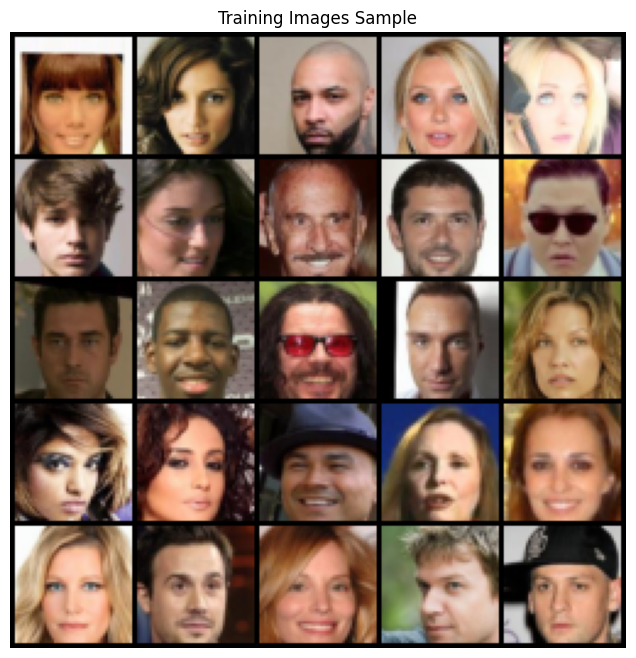

In [ ]:
# 훈련 데이터 샘플 확인
data_iter = iter(train_loader)
images = next(data_iter)

grid = vutils.make_grid(images[:25], nrow=5, padding=2, normalize=True)

plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images Sample")
plt.imshow(np.transpose(grid.cpu(), (1, 2, 0)))
plt.show()

### Utils / Engine Functions (VAE)

In [9]:
def train_one_epoch_for_VAE(model, loader, loss_fn, optimizer, scheduler, device):
    model.train()

    loss_epoch = MeanMetric()
    bce_epoch = MeanMetric()
    kl_epoch = MeanMetric()

    for inputs in tqdm(loader, desc="Train (VAE)"):
        inputs = inputs.to(device).view(inputs.size(0), -1)

        optimizer.zero_grad()
        x_recon, mu, logvar = model(inputs)
        loss, bce, kl = loss_fn(inputs, x_recon, mu, logvar)
        loss.backward()
        optimizer.step()
        scheduler.step()

        loss_epoch.update(loss.detach().cpu())
        bce_epoch.update(bce.detach().cpu())
        kl_epoch.update(kl.detach().cpu())

    summary = {
        'loss': loss_epoch.compute(),
        'kl': kl_epoch.compute(),
        'bce': bce_epoch.compute()
    }

    return summary

def eval_one_epoch_for_VAE(model, loader, loss_fn, device):
    model.eval()

    loss_epoch = MeanMetric()
    bce_epoch = MeanMetric()
    kl_epoch = MeanMetric()

    with torch.no_grad():
        for inputs  in tqdm(loader, desc="Validation (VAE)"):
            inputs = inputs.to(device).view(inputs.size(0), -1)
            x_recon, mu, logvar = model(inputs)
            loss, bce, kl = loss_fn(inputs, x_recon, mu, logvar)

            loss_epoch.update(loss.detach().cpu())
            bce_epoch.update(bce.detach().cpu())
            kl_epoch.update(kl.detach().cpu())

    summary = {
        'loss': loss_epoch.compute(),
        'kl': kl_epoch.compute(),
        'bce': bce_epoch.compute(),
    }
    return summary

def save_model(path, model, optimizer, scheduler, epoch):
    state_dict = {
        'epoch': epoch,
        'model': model.state_dict(),
        'optimizer': optimizer.state_dict(),
        'scheduler': scheduler.state_dict() if scheduler is not None else None,
    }
    torch.save(state_dict, path)

def get_tensorboard_writer(log_dir):
    writer = SummaryWriter(log_dir=log_dir)
    return writer

def log_tensorboard(writer, epoch, train_summary, val_summary):
    for key in train_summary:
        writer.add_scalar(f'Loss/train/{key}', train_summary[key], epoch)

    for key in val_summary:
        writer.add_scalar(f'Loss/val/{key}', val_summary[key], epoch)


@torch.no_grad()
def generate_fn(model, n_samples, device, latent_dim):
    z = torch.randn(n_samples, latent_dim, device=device)
    samples = model.decoder(z)
    samples = samples.view(-1, 3, 48, 48)
    return samples

### ELBO Loss Function 구현

아래는 VAE/ConvVAE에서 사용하는 ELBO (Evidence Lower Bound) Loss 함수의 뼈대 코드입니다.

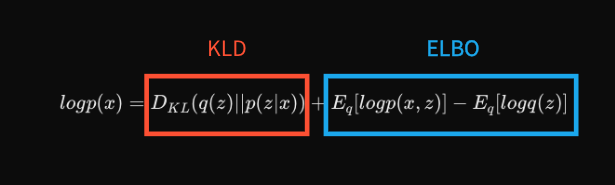

**주요 목표**
- 재구성 오차(Reconstruction Loss, BCE Loss): 복원 이미지와 입력 이미지가 얼마나 다른지 측정합니다.
- 쿨백-라이블러 발산(KL Divergence, KLD): 잠재공간 분포가 표준 정규분포와 얼마나 다른지 측정합니다.

아래 빈칸(____)을 채워 완성된 loss 함수를 구현해주세요.

In [10]:
def elbo_loss(x, recon_x, mu, logvar):
    """
    Args:
        x : 입력 이미지 ; Shape: (B, C, H, W)
        recon_x : 복원 이미지 ; Shape: (B, C, H, W)
        mu : 인코더가 예측한 평균 ; Shape: (B, latent_dim)
        logvar : 인코더가 예측한 로그분산 ; Shape: (B, latent_dim)
    Returns:
        total_loss : 전체 ELBO 손실
        BCE : 재구성 오차 (복원 vs 입력)
        KLD : KL divergence (잠재분포 vs 표준정규분포)
    """
    B = x.size(0)

    # 1. Reconstruction Loss (BCE Loss)
    BCE = F.binary_cross_entropy(_____, _____, reduction='sum') / B

    # 2. KL Divergence (쿨백-라이블러 발산)
    KLD = -0.5 * torch.sum(1 + _____ - _____.pow(2) - _____.exp()) / B

    # 3. Total Loss
    total_loss = _____ + _____

    return total_loss, BCE, KLD

### Test ELBO Loss

ELBO Loss가 제대로 구현되었는지 테스트

In [ ]:
B, C, H, W = 2, 1, 28, 28
latent_dim = 8

x = torch.rand(B, C, H, W)
recon_x = torch.rand(B, C, H, W)
mu = torch.randn(B, latent_dim)
logvar = torch.randn(B, latent_dim)

total_loss, BCE, KLD = elbo_loss(x, recon_x, mu, logvar)

assert total_loss.item() >= 0, "총 loss가 음수입니다."
assert BCE.item() >= 0, "BCE loss가 음수입니다."
assert KLD.item() >= 0, "KL divergence가 음수입니다."
assert np.isclose(total_loss.item(), BCE.item() + KLD.item(), atol=1e-6), "Total = BCE + KLD가 아닙니다."
assert x.shape == recon_x.shape, "입력과 출력 shape이 다릅니다."
assert mu.shape == logvar.shape, "mu, logvar shape이 다릅니다."

print("채점 기준 모두 통과!")


채점 기준 모두 통과!


### 📌 기본 VAE (Fully-connected) 모델 구현

VAE 모델은 다음과 같은 구조로 구성됩니다:

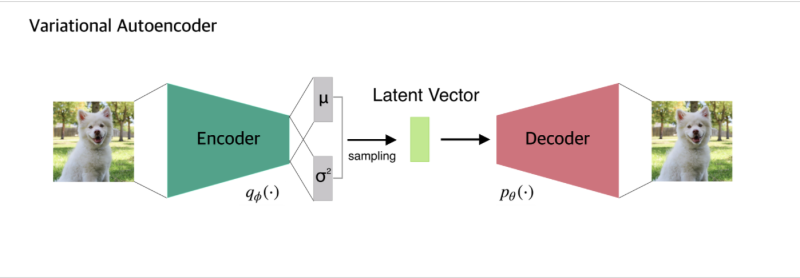

- **Encoder**: 입력 데이터를 잠재 벡터(평균 및 분산)로 압축
- **Reparameterization trick**: backpropagation이 가능하도록 잠재변수 샘플링
- **Decoder**: 잠재 벡터를 원본 데이터로 복원

아래에 정의된 클래스를 통해 구현된 모델 구조를 이해한 뒤, 실제로 학습을 수행하여 이미지 생성 결과를 관찰해봅시다.

In [ ]:
class Encoder(nn.Module):
    def __init__(self, input_dim=6912, hidden_dim=1024, latent_dim=128):
        super().__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.fc_mu = nn.Linear(hidden_dim, latent_dim)
        self.fc_logvar = nn.Linear(hidden_dim, latent_dim)

    def forward(self, x):
        h = self.relu(self.fc1(x))
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dim=128, hidden_dim=1024, output_dim=6912):
        super().__init__()
        self.fc1 = nn.Linear(latent_dim, hidden_dim)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_dim, output_dim)
        self.sigmoid = nn.Sigmoid()

    def forward(self, z):
        h = self.relu(self.fc1(z))
        out = self.sigmoid(self.fc2(h))
        return out

class VAE(nn.Module):
    def __init__(self, in_channels=6912, hidden_dim=1024, latent_dim=128):
        super().__init__()
        self.encoder = Encoder(in_channels, hidden_dim, latent_dim)
        self.decoder = Decoder(latent_dim, hidden_dim, in_channels)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        x = x.view(x.size(0), -1)   # [B, 6912]
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        decoder_output = self.decoder(z)
        return decoder_output, mu, logvar

### Hyperparameters (VAE)

In [14]:
title = 'VAE'
data_dir = 'data'
batch_size = 512

in_channels = 6912
hidden_dim = 1024
latent_dim = 128
epochs = 10
lr = 3e-4
weight_decay = 0.0
checkpoint_dir = 'checkpoints/VAE'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

if device == 'cuda':
    device_name = '/ ' + torch.cuda.get_device_name(0)
else:
    device_name = '/ cpu'

os.makedirs(checkpoint_dir, exist_ok=True)

print("사용 중인 device:", device, device_name)

사용 중인 device: cuda / Tesla T4


### Training VAE
- VAE를 학습시키고, Tensorboard를 통해 로그를 확인해보세요.

In [15]:
model = VAE(
    in_channels=in_channels,
    hidden_dim=hidden_dim,
    latent_dim=latent_dim,
).to(device)

loss_fn = elbo_loss

optimizer = optim.AdamW(
    params=model.parameters(),
    lr=lr,
    weight_decay=weight_decay,
)

scheduler = optim.lr_scheduler.CosineAnnealingLR(
    optimizer=optimizer,
    T_max=epochs * len(train_loader),
)

In [16]:
writer = get_tensorboard_writer(checkpoint_dir)

best_val_loss = float('inf')
best_val_epoch = 0

for epoch in range(epochs):
    train_summary = train_one_epoch_for_VAE(
        model=model,
        loader=train_loader,
        loss_fn=loss_fn,
        optimizer=optimizer,
        scheduler=scheduler,
        device=device,
    )
    val_summary = eval_one_epoch_for_VAE(
        model=model,
        loader=val_loader,
        loss_fn=loss_fn,
        device=device,
    )
    log_tensorboard(writer, epoch + 1, train_summary, val_summary)

    if val_summary['loss'] < best_val_loss:
        best_val_loss = val_summary['loss']
        best_val_epoch = epoch + 1

    # Save model
    if (epoch+1) in [1, 5, 10]:
        checkpoint_path = f'{checkpoint_dir}/{title}_epoch{epoch+1}.pt'
        save_model(checkpoint_path, model, optimizer, scheduler, epoch+1)

    print(f'Epoch {epoch+1:3d}/{epochs} | '
          f'Train loss: {train_summary["loss"]:.4f}, '
          f'Val loss: {val_summary["loss"]:.4f}, '
          f'Best val epoch: {best_val_epoch}')

writer.close()

Validation (VAE): 100%|██████████| 39/39 [00:07<00:00,  5.30it/s]


Epoch   1/10 | Train loss: 4106.4224, Val loss: 3993.9688, Best val epoch: 1


Validation (VAE): 100%|██████████| 39/39 [00:07<00:00,  5.04it/s]


Epoch   2/10 | Train loss: 3938.2070, Val loss: 3928.7612, Best val epoch: 2


Validation (VAE): 100%|██████████| 39/39 [00:07<00:00,  5.01it/s]


Epoch   3/10 | Train loss: 3895.2808, Val loss: 3901.3052, Best val epoch: 3


Validation (VAE): 100%|██████████| 39/39 [00:07<00:00,  4.95it/s]


Epoch   4/10 | Train loss: 3866.8276, Val loss: 3873.8486, Best val epoch: 4


Validation (VAE): 100%|██████████| 39/39 [00:07<00:00,  4.92it/s]


Epoch   5/10 | Train loss: 3850.6321, Val loss: 3863.4055, Best val epoch: 5


Validation (VAE): 100%|██████████| 39/39 [00:07<00:00,  4.96it/s]


Epoch   6/10 | Train loss: 3840.4290, Val loss: 3854.5176, Best val epoch: 6


Validation (VAE): 100%|██████████| 39/39 [00:07<00:00,  4.94it/s]


Epoch   7/10 | Train loss: 3834.0825, Val loss: 3849.8533, Best val epoch: 7


Validation (VAE): 100%|██████████| 39/39 [00:07<00:00,  5.45it/s]


Epoch   8/10 | Train loss: 3830.1475, Val loss: 3847.2351, Best val epoch: 8


Validation (VAE): 100%|██████████| 39/39 [00:06<00:00,  5.90it/s]


Epoch   9/10 | Train loss: 3828.3315, Val loss: 3846.3469, Best val epoch: 9


Validation (VAE): 100%|██████████| 39/39 [00:06<00:00,  5.74it/s]


Epoch  10/10 | Train loss: 3827.6077, Val loss: 3846.1467, Best val epoch: 10


In [17]:
# Tensorboard로 모델 학습 로그 확인
%load_ext tensorboard
%tensorboard --logdir checkpoints/VAE

<IPython.core.display.Javascript object>

### 생성 이미지 시각화 및 저장 (VAE)
- 1, 5, 10 epoch 학습했을 때의 생성 결과를 비교해보세요.

Sample image saved to checkpoints/VAE/VAE_epoch1_5_10_samples.png


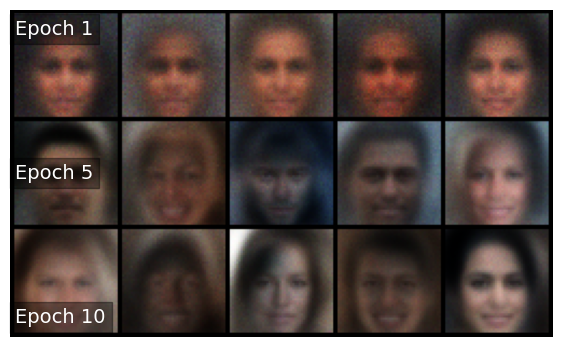

In [18]:
n_samples = 5
epoch_list = [1, 5, 10]
model_paths = [f'{checkpoint_dir}/{title}_epoch{e}.pt' for e in epoch_list]
legend_epochs = [str(e) for e in epoch_list]

all_samples = []

for model_path in model_paths:
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['model'])
    model.eval()

    samples = generate_fn(model, n_samples, device, latent_dim)

    all_samples.append(samples)

final_grid = torch.cat(all_samples, dim=0)
grid_img = torchvision.utils.make_grid(final_grid, nrow=n_samples, normalize=True, padding=2)

npimg = grid_img.cpu().numpy()
plt.figure(figsize=(7, 5))
plt.axis('off')
plt.imshow(np.transpose(npimg, (1, 2, 0)))

for i, label in enumerate(legend_epochs):
    plt.text(2, i * 67 + 11, f"Epoch {label}", fontsize=14, color='w',
             bbox=dict(facecolor='black', alpha=0.4))

# 저장
save_path = os.path.join(checkpoint_dir, f"{title}_epoch1_5_10_samples.png")
torchvision.utils.save_image(grid_img, save_path)
print(f"Sample image saved to {save_path}")

## ❓ Q1.
### 생성된 이미지를 확인해 봤을 때, epoch이 증가함에 따라 생성 이미지 품질이 어떻게 변화하는지 관찰 결과를 서술하세요.

정답:

### 📌 ConvVAE (Convolutional VAE) 모델 구현

ConvVAE는 컨볼루션 신경망(CNN)을 기반으로 이미지를 처리합니다. 컨볼루션 레이어를 통해 이미지의 지역적이고 공간적인 특징을 효과적으로 학습합니다.

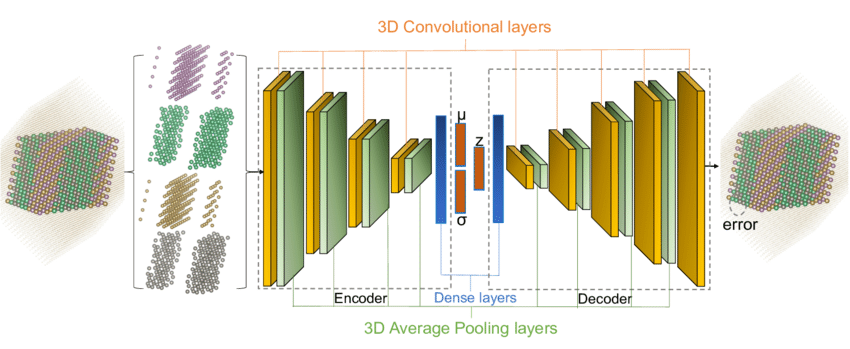

- Encoder는 컨볼루션(conv) + pooling으로 이미지 크기를 압축합니다.
- Decoder는 transposed convolution (conv transpose)을 통해 압축된 잠재 변수를 이미지로 복원합니다.

In [19]:
import torch
from torch import nn

class ConvEncoder(nn.Module):
    def __init__(self, latent_dim, num_features=32, img_channels=3):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(img_channels, num_features, 4, 2, 1),      # 48 -> 24
            nn.BatchNorm2d(num_features),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(num_features, num_features * 2, 4, 2, 1),  # 24 -> 12
            nn.BatchNorm2d(num_features * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(num_features * 2, num_features * 4, 4, 2, 1), # 12 -> 6
            nn.BatchNorm2d(num_features * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(num_features * 4, num_features * 8, 4, 2, 1), # 6 -> 3
            nn.BatchNorm2d(num_features * 8),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.flatten = nn.Flatten()

        self.fc_mu = nn.Linear(num_features * 8 * 3 * 3, latent_dim)
        self.fc_logvar = nn.Linear(num_features * 8 * 3 * 3, latent_dim)

    def forward(self, x):
        h = self.conv(x)
        h = self.flatten(h)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar

class ConvDecoder(nn.Module):
    def __init__(self, latent_dim, num_features=32, img_channels=3):
        super().__init__()
        self.num_features = num_features

        self.fc = nn.Linear(latent_dim, self.num_features * 8 * 3 * 3)

        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(self.num_features * 8, self.num_features * 4, 4, 2, 1), # 3 -> 6
            nn.BatchNorm2d(self.num_features * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(self.num_features * 4, self.num_features * 2, 4, 2, 1), # 6 -> 12
            nn.BatchNorm2d(self.num_features * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(self.num_features * 2, self.num_features, 4, 2, 1), # 12 -> 24
            nn.BatchNorm2d(self.num_features),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(self.num_features, img_channels, 4, 2, 1), # 24 -> 48
            nn.Sigmoid()
        )

    def forward(self, z):
        h = self.fc(z).view(z.size(0), self.num_features * 8, 3, 3)
        x_hat = self.deconv(h)
        return x_hat

class ConvVAE(nn.Module):
    def __init__(self, latent_dim=16, num_features=32, img_channels=3):
        super().__init__()
        self.encoder = ConvEncoder(latent_dim, num_features, img_channels)
        self.decoder = ConvDecoder(latent_dim, num_features, img_channels)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        x_hat = self.decoder(z)
        return x_hat, mu, logvar

### Engine Functions (ConvVAE)
- train, eval 함수를 제외한 나머지 함수는 기존 VAE와 동일합니다.

In [20]:
def train_one_epoch_for_ConvVAE(model, loader, loss_fn, optimizer, device):
    model.train()

    loss_epoch = MeanMetric()
    bce_epoch = MeanMetric()
    kld_epoch = MeanMetric()

    for x in tqdm(loader, desc="Train (ConvVAE)"):
        x = x.to(device)
        optimizer.zero_grad()
        x_hat, mu, logvar = model(x)
        loss, bce, kld = loss_fn(x, x_hat, mu, logvar)
        loss.backward()
        optimizer.step()

        loss_epoch.update(loss.detach().cpu())
        bce_epoch.update(bce.detach().cpu())
        kld_epoch.update(kld.detach().cpu())

    summary = {
        'loss': loss_epoch.compute(),
        'bce': bce_epoch.compute(),
        'kld': kld_epoch.compute()
    }
    return summary

def eval_one_epoch_for_ConvVAE(model, loader, loss_fn, device):
    model.eval()

    loss_epoch = MeanMetric()
    bce_epoch = MeanMetric()
    kld_epoch = MeanMetric()

    with torch.no_grad():
        for x in tqdm(loader, desc="Validation (ConvVAE)"):
            x = x.to(device)
            x_hat, mu, logvar = model(x)
            loss, bce, kld = loss_fn(x, x_hat, mu, logvar)

            loss_epoch.update(loss.detach().cpu())
            bce_epoch.update(bce.detach().cpu())
            kld_epoch.update(kld.detach().cpu())

    summary = {
        'loss': loss_epoch.compute(),
        'bce': bce_epoch.compute(),
        'kld': kld_epoch.compute()
    }
    return summary

### Hyperparameters (ConvVAE)

In [21]:
# --- 하이퍼파라미터 및 디렉토리 ---
title = 'ConvVAE'
data_dir = 'data'
batch_size = 512

img_channels = 3
img_size = 48
num_features = 32
latent_dim = 16
epochs = 10
lr = 3e-4
weight_decay = 0.0

checkpoint_dir = 'checkpoints/ConvVAE'
device = 'cuda' if torch.cuda.is_available() else 'cpu'
if device == 'cuda':
    device_name = '/ ' + torch.cuda.get_device_name(0)
else:
    device_name = '/ cpu'

os.makedirs(checkpoint_dir, exist_ok=True)

print("사용 중인 device:", device, device_name)

사용 중인 device: cuda / Tesla T4


### Training ConvVAE
- ConvVAE를 학습시키고, Tensorboard를 통해 로그를 확인해보세요.

In [22]:
model = ConvVAE(
    latent_dim=latent_dim,
    num_features=num_features,
    img_channels=img_channels,
).to(device)

loss_fn = elbo_loss

optimizer = optim.AdamW(
    params=model.parameters(),
    lr=lr,
    weight_decay=weight_decay,
)

scheduler = optim.lr_scheduler.CosineAnnealingLR(
    optimizer=optimizer,
    T_max=epochs * len(train_loader),
)

In [23]:
writer = get_tensorboard_writer(checkpoint_dir)

best_val_loss = float('inf')
best_val_epoch = 0

for epoch in range(epochs):
    train_summary = train_one_epoch_for_ConvVAE(
        model=model,
        loader=train_loader,
        loss_fn=loss_fn,
        optimizer=optimizer,
        device=device,
    )
    val_summary = eval_one_epoch_for_ConvVAE(
        model=model,
        loader=val_loader,
        loss_fn=loss_fn,
        device=device,
    )
    log_tensorboard(writer, epoch + 1, train_summary, val_summary)

    if val_summary['loss'] < best_val_loss:
        best_val_loss = val_summary['loss']
        best_val_epoch = epoch + 1

    # Save model
    if (epoch+1) in [1, 5, 10]:
        checkpoint_path = f'{checkpoint_dir}/{title}_epoch{epoch+1}.pt'
        torch.save({
            'epoch': epoch+1,
            'model': model.state_dict(),
            'optimizer': optimizer.state_dict(),
        }, checkpoint_path)

    print(f'Epoch {epoch+1:3d}/{epochs} | '
          f'Train loss: {train_summary["loss"]:.4f}, '
          f'Val loss: {val_summary["loss"]:.4f}, '
          f'Best val epoch: {best_val_epoch}')

Train (ConvVAE):   0%|          | 0/317 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Validation (ConvVAE): 100%|██████████| 39/39 [00:08<00:00,  4.68it/s]


Epoch   1/10 | Train loss: 3951.0039, Val loss: 3851.4661, Best val epoch: 1


Validation (ConvVAE): 100%|██████████| 39/39 [00:07<00:00,  4.88it/s]


Epoch   2/10 | Train loss: 3828.2290, Val loss: 3841.2849, Best val epoch: 2


Validation (ConvVAE): 100%|██████████| 39/39 [00:06<00:00,  5.71it/s]


Epoch   3/10 | Train loss: 3819.9114, Val loss: 3837.0854, Best val epoch: 3


Validation (ConvVAE): 100%|██████████| 39/39 [00:07<00:00,  5.41it/s]


Epoch   4/10 | Train loss: 3815.5237, Val loss: 3832.6868, Best val epoch: 4


Validation (ConvVAE): 100%|██████████| 39/39 [00:08<00:00,  4.66it/s]


Epoch   5/10 | Train loss: 3811.8884, Val loss: 3828.7383, Best val epoch: 5


Validation (ConvVAE): 100%|██████████| 39/39 [00:08<00:00,  4.72it/s]


Epoch   6/10 | Train loss: 3809.4758, Val loss: 3826.8474, Best val epoch: 6


Validation (ConvVAE): 100%|██████████| 39/39 [00:07<00:00,  5.23it/s]


Epoch   7/10 | Train loss: 3807.5166, Val loss: 3825.3350, Best val epoch: 7


Validation (ConvVAE): 100%|██████████| 39/39 [00:06<00:00,  5.61it/s]


Epoch   8/10 | Train loss: 3805.8406, Val loss: 3824.3799, Best val epoch: 8


Validation (ConvVAE): 100%|██████████| 39/39 [00:08<00:00,  4.74it/s]


Epoch   9/10 | Train loss: 3804.6274, Val loss: 3822.0769, Best val epoch: 9


Validation (ConvVAE): 100%|██████████| 39/39 [00:07<00:00,  5.50it/s]

Epoch  10/10 | Train loss: 3803.2322, Val loss: 3822.0027, Best val epoch: 10


In [24]:
# Tensorboard로 모델 학습 로그 확인

%reload_ext tensorboard
%tensorboard --logdir checkpoints/ConvVAE

<IPython.core.display.Javascript object>

### 생성 이미지 시각화 및 저장 (ConvVAE)
- 1, 5, 10 epoch 학습했을 때의 생성 결과를 비교해보세요.

Sample image saved to checkpoints/ConvVAE/ConvVAE_epoch1_5_10_samples.png


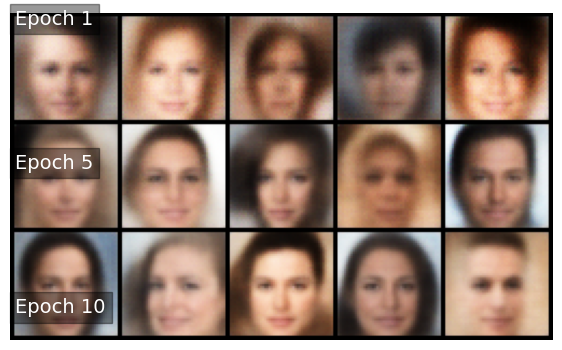

In [25]:
n_samples = 5
epoch_list = [1, 5, 10]
model_paths = [f'{checkpoint_dir}/{title}_epoch{e}.pt' for e in epoch_list]
legend_epochs = [str(e) for e in epoch_list]

all_samples = []

for model_path in model_paths:
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['model'])
    model.eval()

    samples = generate_fn(model, n_samples, device, latent_dim)

    all_samples.append(samples)

final_grid = torch.cat(all_samples, dim=0)
grid_img = torchvision.utils.make_grid(final_grid, nrow=n_samples, normalize=True, padding=2)
npimg = grid_img.cpu().numpy()

plt.figure(figsize=(7, 5))
plt.axis('off')
plt.imshow(np.transpose(npimg, (1,2,0)).squeeze(), cmap='gray')

for i, label in enumerate(legend_epochs):
    plt.text(2, i * 67 + 5, f"Epoch {label}", fontsize=14, color='w',
             bbox=dict(facecolor='black', alpha=0.4))

save_path = os.path.join(checkpoint_dir, f"{title}_epoch1_5_10_samples.png")
torchvision.utils.save_image(grid_img, save_path)
print(f"Sample image saved to {save_path}")

### 사용 모델의 총 파라미터 수 비교

In [26]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

fc_vae_model = VAE()
fc_vae_params = count_parameters(fc_vae_model)

conv_vae_model = ConvVAE()
conv_vae_params = count_parameters(conv_vae_model)

print("======= 모델 파라미터 수 비교 =======")
print(f"FC VAE 모델의 파라미터 수: {fc_vae_params:,}")
print(f"ConvVAE 모델의 파라미터 수: {conv_vae_params:,}")
print("====================================")

======= 모델 파라미터 수 비교 =======
FC VAE 모델의 파라미터 수: 14,558,208
ConvVAE 모델의 파라미터 수: 1,494,371


## ❓ Q2.
### 1) 어떤 모델이 더 나은 생성 결과를 보였으며, 그 이유는 무엇인가요?

정답:

### 2) 총 학습 파라미터 수와 생성된 이미지 품질이 비례했나요?

정답:

### Manifold 관찰
아래 코드는 잠재벡터 z의 한 차원(dim_idx)만 값을 바꿔가며 이미지를 생성합니다.

잠재공간(z)의 한 차원을 바꿀 때마다 생성되는 이미지가 점진적으로 어떻게 변하는지 관찰해보세요.

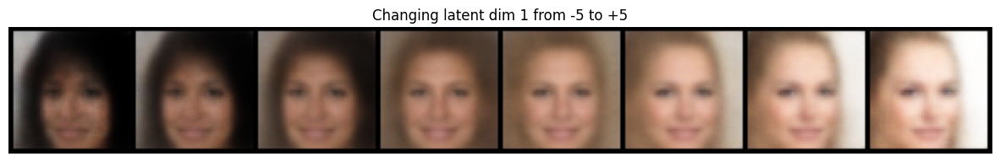

In [ ]:
z = torch.zeros((1, latent_dim), device=device)

dim_idx = 1 # 이 값을 수정해가며 관찰해보세요! (0 ~ 15)
steps = 8
values = np.linspace(-5, 5, steps)

samples = []
for v in values:
    z_temp = z.clone()
    z_temp[0, dim_idx] = v
    with torch.no_grad():
        sample = model.decoder(z_temp).cpu()
    if sample.ndim == 2 and sample.shape[1] == 6912:
        sample = sample.view(-1, 3, 48, 48)
    samples.append(sample)

samples = torch.cat(samples, dim=0)
grid_img = torchvision.utils.make_grid(samples, nrow=steps, normalize=True, padding=2)
npimg = grid_img.numpy()

plt.figure(figsize=(15, 4))
plt.axis('off')
plt.imshow(np.transpose(npimg, (1,2,0)).squeeze())
plt.title(f'Changing latent dim {dim_idx} from -5 to +5')
plt.show()

## ❓ Q3.
### 이런 실험을 통해 생성 모델(VAE)의 잠재공간이 어떤 의미를 가지는지 간단히 설명해 보세요.
**Hint: Manifold space**

정답:

### ✨ 이번 과제도 수고하셨습니다! ✨